In [1]:
#Importing relevant libraries
import os
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
import random
import numpy as np
import math
from sklearn.model_selection import train_test_split
import pickle
import tensorflow as tf
from tensorflow.keras.callbacks import LearningRateScheduler,ReduceLROnPlateau
from tensorflow.keras import models, layers
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D, Conv2DTranspose, BatchNormalization, Activation, Flatten, Dense, Input, MaxPooling2D, Add, Reshape, concatenate, AveragePooling2D, Multiply, GlobalAveragePooling2D, UpSampling2D, MaxPool2D,Softmax
from tensorflow.keras.activations import softmax
from tensorflow.keras import initializers, regularizers
from tensorflow.keras.optimizers import Adam
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

##Extracting Image paths for BSD400 Dataset

In [2]:
df = pd.DataFrame()

dir = os.listdir(r'C:\\Users\\V RAHUL\\Codes\\EE6310\Datasets\BSD400\\train\\original')
GT = []
for image in dir:
  GT.append(r'C:\\Users\\V RAHUL\\Codes\\EE6310\Datasets\BSD400\\train\\original\\'+image)

dir = os.listdir(r'C:\\Users\\V RAHUL\\Codes\\EE6310\Datasets\BSD400\\train\\noisy')
Nsy=[]
for image in dir:
  Nsy.append(r'C:\\Users\\V RAHUL\\Codes\\EE6310\Datasets\BSD400\\train\\noisy\\'+image)

df['Ground Truth Images'] = GT
df['Noisy Images'] = Nsy
print(df.head())
print(df.shape)

                                 Ground Truth Images  \
0  C:\\Users\\V RAHUL\\Codes\\EE6310\Datasets\BSD...   
1  C:\\Users\\V RAHUL\\Codes\\EE6310\Datasets\BSD...   
2  C:\\Users\\V RAHUL\\Codes\\EE6310\Datasets\BSD...   
3  C:\\Users\\V RAHUL\\Codes\\EE6310\Datasets\BSD...   
4  C:\\Users\\V RAHUL\\Codes\\EE6310\Datasets\BSD...   

                                        Noisy Images  
0  C:\\Users\\V RAHUL\\Codes\\EE6310\Datasets\BSD...  
1  C:\\Users\\V RAHUL\\Codes\\EE6310\Datasets\BSD...  
2  C:\\Users\\V RAHUL\\Codes\\EE6310\Datasets\BSD...  
3  C:\\Users\\V RAHUL\\Codes\\EE6310\Datasets\BSD...  
4  C:\\Users\\V RAHUL\\Codes\\EE6310\Datasets\BSD...  
(400, 2)


##Image Sizes

In [3]:
size=[]
for i in range(len(df)):
  img_gt = cv2.imread(df['Ground Truth Images'].iloc[i])
  size.append(img_gt.shape)

df['image size'] = size
df['image size'] = df['image size'].astype(str)
df.head()

,Ground Truth Images,Noisy Images,image size
0,C:\\Users\\V RAHUL\\Codes\\EE6310\Datasets\BSD...,C:\\Users\\V RAHUL\\Codes\\EE6310\Datasets\BSD...,"(180, 180, 3)"
1,C:\\Users\\V RAHUL\\Codes\\EE6310\Datasets\BSD...,C:\\Users\\V RAHUL\\Codes\\EE6310\Datasets\BSD...,"(180, 180, 3)"
2,C:\\Users\\V RAHUL\\Codes\\EE6310\Datasets\BSD...,C:\\Users\\V RAHUL\\Codes\\EE6310\Datasets\BSD...,"(180, 180, 3)"
3,C:\\Users\\V RAHUL\\Codes\\EE6310\Datasets\BSD...,C:\\Users\\V RAHUL\\Codes\\EE6310\Datasets\BSD...,"(180, 180, 3)"
4,C:\\Users\\V RAHUL\\Codes\\EE6310\Datasets\BSD...,C:\\Users\\V RAHUL\\Codes\\EE6310\Datasets\BSD...,"(180, 180, 3)"


Text(0, 0.5, 'No. of images')

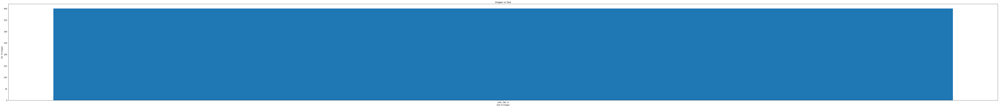

In [4]:
fig = plt.figure(figsize = (100, 10))
y = list(df['image size'].value_counts())
x = df['image size'].value_counts().index.tolist()
plt.bar(x,y)
plt.title("Images vs Size")
plt.xlabel("Size of images")
plt.ylabel("No. of images")

##Displaying few clean-noisy image pairs

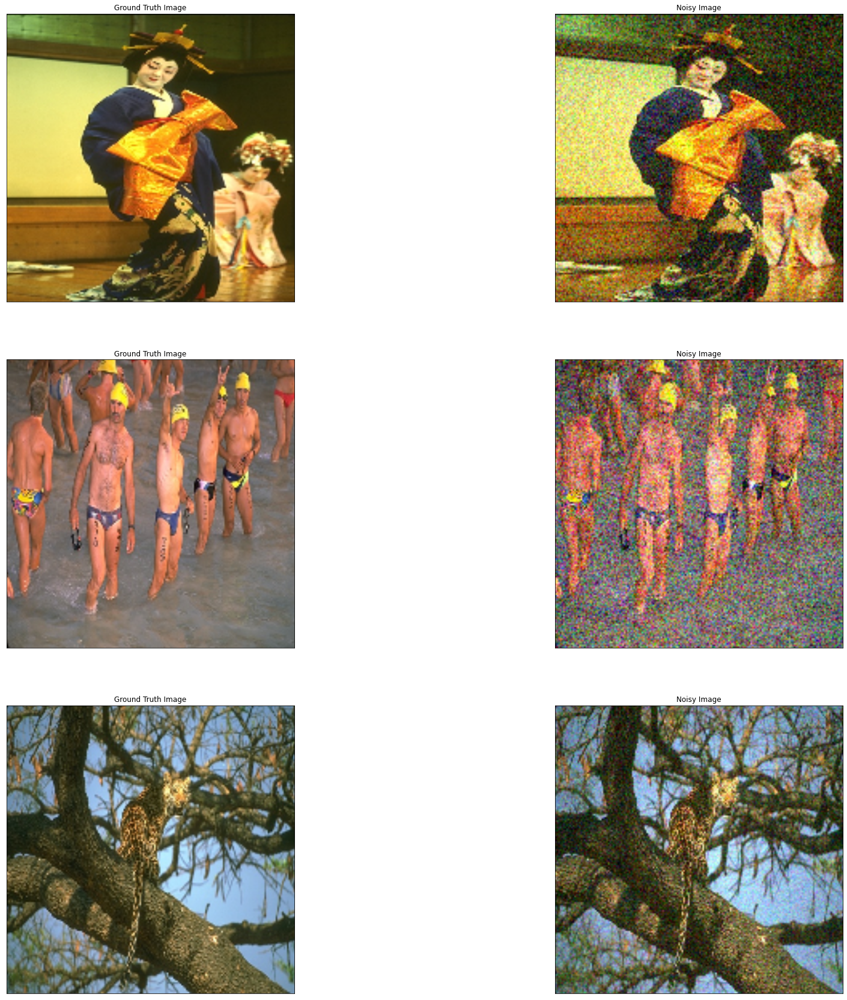

In [5]:
sample = df.sample(3)
fig, ax = plt.subplots(len(sample),2,figsize=(30,30))
for i in range(len(sample)):
  img = cv2.imread(sample['Ground Truth Images'].iloc[i])
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  img = cv2.resize(img,(512,512))
  ax[i][0].imshow(img)
  ax[i][0].get_xaxis().set_visible(False)
  ax[i][0].get_yaxis().set_visible(False)
  ax[i][0].title.set_text("Ground Truth Image")
  
  img = cv2.imread(sample['Noisy Images'].iloc[i])
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  img = cv2.resize(img,(512,512))
  ax[i][1].imshow(img)
  ax[i][1].get_xaxis().set_visible(False)
  ax[i][1].get_yaxis().set_visible(False)
  ax[i][1].title.set_text("Noisy Image")

##Splitting the dataset into train and test datasets

In [6]:
X = df['Noisy Images']
y = df['Ground Truth Images']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(320,)
(320,)
(80,)
(80,)


In [7]:
X_train_patches = []
y_train_patches = []
for i in range(len(X_train)):
  path = X_train.iloc[i]
  img_nsy = cv2.imread(path)
  img_nsy = cv2.cvtColor(img_nsy, cv2.COLOR_BGR2RGB)
  img_nsy = cv2.resize(img_nsy,(256,256))  #resizing the X_test images
  
  path = y_train.iloc[i]
  img_gt = cv2.imread(path)
  img_gt = cv2.cvtColor(img_gt, cv2.COLOR_BGR2RGB)
  img_gt = cv2.resize(img_gt,(256,256))  #resizing the X_test images

  X_train_patches.append(img_nsy)
  y_train_patches.append(img_gt)
  
X_train = np.array(X_train_patches)
y_train = np.array(y_train_patches)

In [8]:
X_test_patches = []
y_test_patches = []
for i in range(len(X_test)):
  path = X_test.iloc[i]
  img_nsy = cv2.imread(path)
  img_nsy = cv2.cvtColor(img_nsy, cv2.COLOR_BGR2RGB)
  img_nsy = cv2.resize(img_nsy,(256,256))  #resizing the X_test images
  
  path = y_test.iloc[i]
  img_gt = cv2.imread(path)
  img_gt = cv2.cvtColor(img_gt, cv2.COLOR_BGR2RGB)
  img_gt = cv2.resize(img_gt,(256,256))  #resizing the X_test images

  X_test_patches.append(img_nsy)
  y_test_patches.append(img_gt)

X_test = np.array(X_test_patches)
y_test = np.array(y_test_patches)

In [9]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

print("Total number of images on train data : ", len(X_train))
print("Total number of images on test data : ", len(X_test))

(320, 256, 256, 3)
(320, 256, 256, 3)
(80, 256, 256, 3)
(80, 256, 256, 3)
Total number of images on train data :  320
Total number of images on test data :  80


In [10]:
#Storing the image patches as pickle files
import pickle
pickle.dump((X_train,y_train),open('train_data.pkl','wb'))
pickle.dump((X_test,y_test),open('test_data.pkl','wb'))

#Creating Dataset for modeling using custom data generators in Keras 

In [11]:
X_train_patches, y_train_patches = pickle.load(open('train_data.pkl', 'rb'))
X_test_patches,y_test_patches = pickle.load(open('test_data.pkl', 'rb'))

print(X_train_patches.shape)
print(y_train_patches.shape)
print(X_test_patches.shape)
print(y_test_patches.shape)

(320, 256, 256, 3)
(320, 256, 256, 3)
(80, 256, 256, 3)
(80, 256, 256, 3)


In [12]:
#Normalizing the image pixels
X_train_patches = X_train_patches.astype("float32") / 255.0
y_train_patches = y_train_patches.astype("float32") / 255.0
X_test_patches = X_test_patches.astype("float32") / 255.0
y_test_patches = y_test_patches.astype("float32") / 255.0

In [13]:
class Dataloder(tf.keras.utils.Sequence):    
    def __init__(self, X,y,batch_size=1, shuffle=False):
        self.X = X
        self.y = y
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.indexes = np.arange(len(X))

    def __getitem__(self, i):
        # collect batch data
        batch_x = self.X[i * self.batch_size : (i+1) * self.batch_size]
        batch_y = self.y[i * self.batch_size : (i+1) * self.batch_size]
        
        return tuple((batch_x,batch_y))
    
    def __len__(self):
        return len(self.indexes) // self.batch_size
    
    def on_epoch_end(self):
        if self.shuffle:
            self.indexes = np.random.permutation(self.indexes)

In [14]:
batch_size=16
train_dataloader = Dataloder(X_train_patches,y_train_patches, batch_size, shuffle=True)
test_dataloader = Dataloder(X_test_patches,y_test_patches,batch_size, shuffle=True)
print(train_dataloader[0][0].shape)
print(test_dataloader[0][0].shape)

(16, 256, 256, 3)
(16, 256, 256, 3)


#Some plotting and prediction functions that can be used for all model

In [16]:
#Custom function to get denoised image prediction for noisy images
def prediction(img,model):
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  img = cv2.resize(img,(256,256))
  img = img.astype("float32") / 255.0

  nsy=[]
  nsy.append(img)
  nsy = np.array(nsy)
  
  pred_img = model.predict(nsy)

  return pred_img[0]

In [16]:
#Custom function to plot/visualize noisy, ground truth and predicted images
def visualize(sample,model):
  fig,ax = plt.subplots(len(sample),3,figsize=(30,30))
  for i in range(len(sample)):
    path = sample['Ground Truth Images'].iloc[i]
    test_img_gt = cv2.imread(path)
    test_img_gt = cv2.cvtColor(test_img_gt, cv2.COLOR_BGR2RGB)
    test_img_gt = cv2.resize(test_img_gt,(512,512))
    test_img_gt = test_img_gt.astype("float32") / 255.0
  
    path = sample['Noisy Images'].iloc[i]
    test_img_nsy = cv2.imread(path)
    pred_img = prediction(test_img_nsy,model)
    pred_img = cv2.resize(pred_img,(512,512))

    test_img_nsy = cv2.cvtColor(test_img_nsy, cv2.COLOR_BGR2RGB)
    test_img_nsy = cv2.resize(test_img_nsy,(512,512))
    test_img_nsy = test_img_nsy.astype("float32") / 255.0
    
    ax[i][0].imshow(test_img_nsy)
    ax[i][0].get_xaxis().set_visible(False)
    ax[i][0].get_yaxis().set_visible(False)
    ax[i][0].title.set_text("Noisy Image")

    ax[i][1].imshow(test_img_gt)
    ax[i][1].get_xaxis().set_visible(False)
    ax[i][1].get_yaxis().set_visible(False)
    ax[i][1].title.set_text("Ground Truth Image")

    ax[i][2].imshow(pred_img)
    ax[i][2].get_xaxis().set_visible(False)
    ax[i][2].get_yaxis().set_visible(False)
    ax[i][2].title.set_text("Predicted Image")

In [28]:
#Custom function that computes the psnr and ssim values for images
def psnr_and_ssim(X_test,y_test,model,model_type='Normal'):
  psnr_nsy = 0.0
  psnr_de_nsy = 0.0
  ssim_nsy = 0.0
  ssim_de_nsy = 0.0
  for i in range(len(X_test)):
    #getting the noisy images
    path = X_test.iloc[i]
    nsy = cv2.imread(path)  
    #getting the predicted images
    pred = prediction(nsy,model)

    #getting the ground truth images
    path = y_test.iloc[i]
    gt = cv2.imread(path)         
    gt = cv2.cvtColor(gt, cv2.COLOR_BGR2RGB)
    
    #Resizing the images
    gt = cv2.resize(gt,(256,256))
    nsy = cv2.resize(nsy,(256,256))

    #Normalizing the images
    gt = gt.astype("float32") / 255.0
    nsy = nsy.astype("float32") / 255.0

    #Computing psnr and ssim for test images
    psnr_nsy += psnr(gt,nsy)
    psnr_de_nsy += psnr(gt,pred)
    ssim_nsy += ssim(gt,nsy,multichannel=True,data_range=nsy.max() - nsy.min())
    ssim_de_nsy += ssim(gt,pred,multichannel=True,data_range=pred.max() - pred.min())

  psnr_nsy = psnr_nsy/len(X_test)
  psnr_de_nsy = psnr_de_nsy/len(X_test)
  ssim_nsy = ssim_nsy/len(X_test)
  ssim_de_nsy = ssim_de_nsy/len(X_test)
  return psnr_nsy, psnr_de_nsy,ssim_nsy,ssim_de_nsy

#CBDNet

The CBDNet architecture is as shown below. 
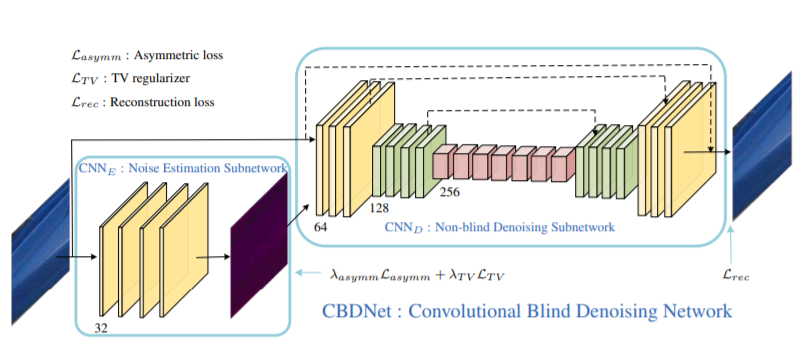

In [18]:
#https://github.com/IDKiro/CBDNet-tensorflow/blob/dev/model.py
tf.keras.backend.clear_session()
input = Input(shape=(256, 256, 3))

#Noise estimation subnetwork
x = Conv2D(32, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(input)
x = Conv2D(32, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(x)
x = Conv2D(32, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(x)
x = Conv2D(32, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(x)
x = Conv2D(3, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(x)

#Non Blind denoising subnetwork
x = concatenate([x,input])
conv1 = Conv2D(64, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(x)
conv2 = Conv2D(64, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(conv1)

pool1 = AveragePooling2D(pool_size=(2,2),padding='same')(conv2)
conv3 = Conv2D(128, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(pool1)
conv4 = Conv2D(128, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(conv3)
conv5 = Conv2D(128, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(conv4)

pool2 = AveragePooling2D(pool_size=(2,2),padding='same')(conv5)
conv6 = Conv2D(256, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(pool2)
conv7 = Conv2D(256, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(conv6)
conv8 = Conv2D(256, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(conv7)
conv9 = Conv2D(256, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(conv8)
conv10 = Conv2D(256, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(conv9)
conv11 = Conv2D(256, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(conv10)

upsample1 = Conv2DTranspose(128, (3, 3), strides=2, activation="relu", kernel_initializer='he_normal',padding="same")(conv11)
add1 = Add()([upsample1,conv5])
conv12 = Conv2D(128, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(add1)
conv13 = Conv2D(128, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(conv12)
conv14 = Conv2D(128, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(conv13)

upsample2 = Conv2DTranspose(64, (3, 3), strides=2, activation="relu", kernel_initializer='he_normal',padding="same")(conv14)
add1 = Add()([upsample2,conv2])
conv15 = Conv2D(64, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(add1)
conv16 = Conv2D(64, (3, 3), activation="relu", kernel_initializer='he_normal',padding="same")(conv15)

out = Conv2D(3, (1,1), kernel_initializer='he_normal',padding="same")(conv16)
out = Add()([out,input])

CBDNet = Model(input,out)
CBDNet.compile(optimizer=tf.keras.optimizers.Adam(1e-03), loss=tf.keras.losses.MeanSquaredError())
CBDNet.summary()

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 256, 256, 32) 896         input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 256, 256, 32) 9248        conv2d[0][0]                     
__________________________________________________________________________________________________
conv2d_2 (Conv2D)               (None, 256, 256, 32) 9248        conv2d_1[0][0]                   
_______________________________________________________________________________________

In [19]:
log_dir="logs/model_2"
tensorboard = tf.keras.callbacks.TensorBoard(log_dir=log_dir,histogram_freq=1, write_graph=True,write_grads=True)
reducelr = ReduceLROnPlateau(monitor='val_loss', factor=0.1,verbose=1,patience=4,min_delta=0.00001)
callback = [tensorboard,reducelr]
CBDNet.fit(train_dataloader,shuffle=True,epochs=15,validation_data= test_dataloader,callbacks=callback)
CBDNet.save('CBDNet.h5')

Epoch 1/15
 1/20 [>.............................] - ETA: 0s - loss: 0.1762WARNING:tensorflow:From c:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\ops\summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.
20/20 [==============================] - 516s 26s/step - loss: 0.0347 - val_loss: 0.0054
Epoch 2/15
20/20 [==============================] - 512s 26s/step - loss: 0.0045 - val_loss: 0.0042
Epoch 3/15
20/20 [==============================] - 504s 25s/step - loss: 0.0036 - val_loss: 0.0035
Epoch 4/15
20/20 [==============================] - 612s 31s/step - loss: 0.0030 - val_loss: 0.0030
Epoch 5/15
20/20 [==============================] - 582s 29s/step - loss: 0.0026 - val_loss: 0.0026
Epoch 6/15
20/20 [==============================] - 491s 25s/step - loss: 0.0023 - val_loss: 0.0024
Epoch 7/15
20/20 [==============================] - 498

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


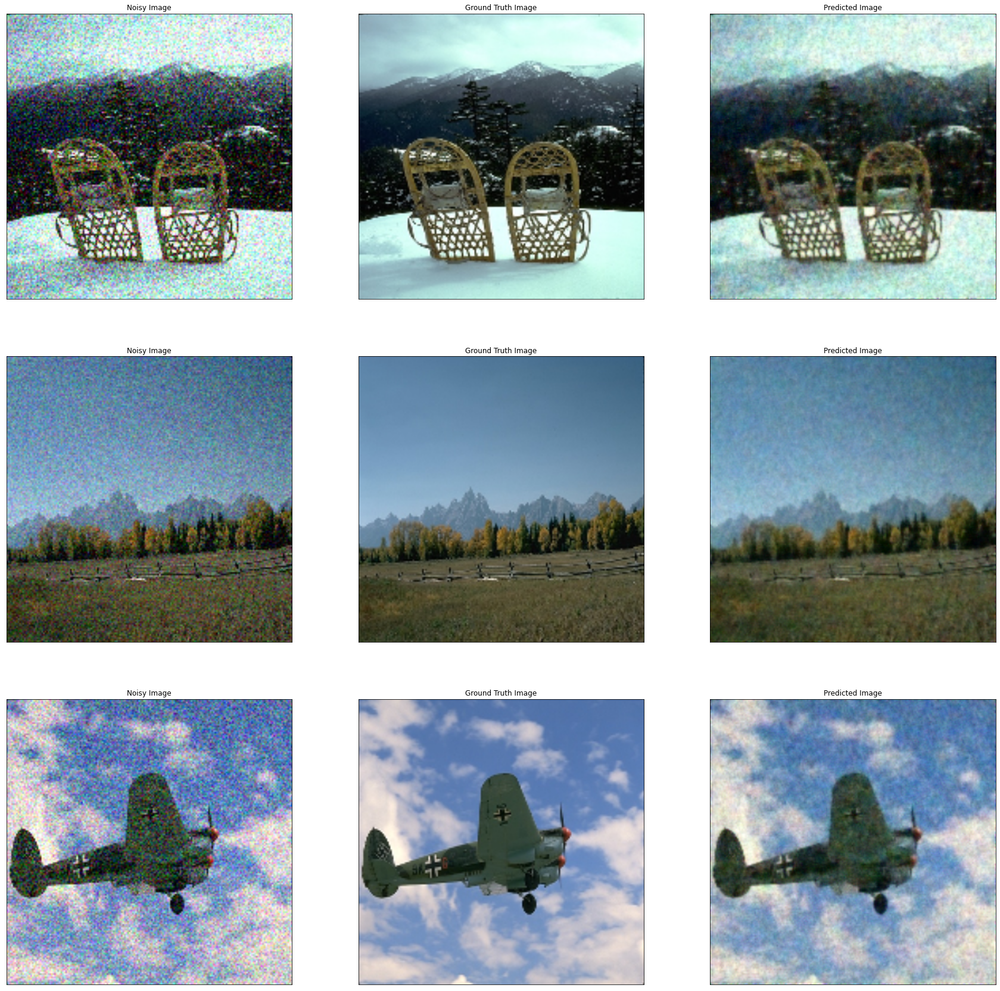

In [50]:
CBDNet = tf.keras.models.load_model(r'C:\\Users\\V RAHUL\\Codes\\EE6310\\CBDNet.h5')
sample = pd.DataFrame({'Ground Truth Images' : [r'C:\\Users\\V RAHUL\\Codes\\EE6310\Datasets\BSD400\\train\\original\\0000.PNG',r'C:\\Users\\V RAHUL\\Codes\\EE6310\Datasets\BSD400\\train\\original\\0001.PNG',r'C:\\Users\\V RAHUL\\Codes\\EE6310\Datasets\BSD400\\train\\original\\0002.PNG'], 'Noisy Images' : [r'C:\\Users\\V RAHUL\\Codes\\EE6310\Datasets\BSD400\\train\\noisy\\0000.PNG',r'C:\\Users\\V RAHUL\\Codes\\EE6310\Datasets\BSD400\\train\\noisy\\0001.PNG',r'C:\\Users\\V RAHUL\\Codes\\EE6310\Datasets\BSD400\\train\\noisy\\0002.PNG']})
visualize(sample,CBDNet)

In [80]:
psnr_nsy, psnr_de_nsy, ssim_nsy, ssim_de_nsy = psnr_and_ssim(X_test,y_test,CBDNet)
print('PSNR before denoising :', psnr_nsy)
print('PSNR after denoising :', psnr_de_nsy)
print('SSIM before denoising :', ssim_nsy)
print('SSIM after denoising :', ssim_de_nsy)

PSNR before denoising : 16.46400013384434
PSNR after denoising : 28.36174932427258
SSIM before denoising : 0.5224263895812342
SSIM after denoising : 0.7732336527624909


In [83]:
model_size = round((os.stat(r'C:\\Users\\V RAHUL\\Codes\\EE6310\\CBDNet.h5').st_size)/(1024**2),3)
PSNR = [];SSIM = [];PSNR_imp = [];SSIM_imp = [];size=[]
PSNR.append(round(psnr_de_nsy,3))
SSIM.append(round(ssim_de_nsy,3))
PSNR_imp.append(round(psnr_de_nsy-psnr_nsy,3))
SSIM_imp.append(round(ssim_de_nsy-ssim_nsy,3))
size.append(model_size)

In [31]:
#Custom function that computes the psnr and ssim values for images
def psnr_and_ssim_(X_test,y_test,model,model_type='Normal'):
  psnr_list = []
  ssim_list = []
  for i in range(len(X_test)):
    #getting the noisy images
    path = X_test.iloc[i]
    nsy = cv2.imread(path)  
    #getting the predicted images
    pred = prediction(nsy,model)

    #getting the ground truth images
    path = y_test.iloc[i]
    gt = cv2.imread(path)         
    gt = cv2.cvtColor(gt, cv2.COLOR_BGR2RGB)
    
    #Resizing the images
    gt = cv2.resize(gt,(256,256))
    nsy = cv2.resize(nsy,(256,256))

    #Normalizing the images
    gt = gt.astype("float32") / 255.0
    nsy = nsy.astype("float32") / 255.0

    #Computing psnr and ssim for test images
    psnr_list.append(psnr(gt,pred))
    ssim_list.append(ssim(gt,pred,multichannel=True,data_range=pred.max() - pred.min()))

  psnr_mean = np.mean(psnr_list)
  psnr_std = np.std(psnr_list)
  ssim_mean = np.mean(ssim_list)
  ssim_std = np.std(ssim_list)
  return psnr_mean,psnr_std,ssim_mean,ssim_std

CBDNet = tf.keras.models.load_model(r'C:\\Users\\V RAHUL\\Codes\\EE6310\\CBDNet.h5')

df = pd.DataFrame()

dir = os.listdir(r'C:\\Users\\V RAHUL\\Codes\\EE6310\Datasets\\CBSD68\\noisy15')
GT = []
for image in dir:
  GT.append(r'C:\\Users\\V RAHUL\\Codes\\EE6310\Datasets\\CBSD68\\noisy15\\'+image)

dir = os.listdir(r'C:\\Users\\V RAHUL\\Codes\\EE6310\Datasets\\CBSD68\\original_png')
Nsy=[]
for image in dir:
  Nsy.append(r'C:\\Users\\V RAHUL\\Codes\\EE6310\Datasets\\CBSD68\\original_png\\'+image)

df['Ground Truth Images'] = GT
df['Noisy Images'] = Nsy

X_test = df['Noisy Images']
y_test = df['Ground Truth Images']

psnr_mean,psnr_std,ssim_mean,ssim_std = psnr_and_ssim_(X_test,y_test,CBDNet)
print('PSNR mean :', psnr_mean)
print('PSNR std :', psnr_std)
print('SSIM mean :', ssim_mean)
print('SSIM std :', ssim_std)

PSNR mean : 26.495746122765212
PSNR std : 0.7781947277077502
SSIM mean : 0.6857380143835453
SSIM std : 0.10352549402156061


In [18]:
df = pd.DataFrame()

dir = os.listdir(r'C:\\Users\\V RAHUL\\Codes\\EE6310\Datasets\\CBSD68\\noisy25')
GT = []
for image in dir:
  GT.append(r'C:\\Users\\V RAHUL\\Codes\\EE6310\Datasets\\CBSD68\\noisy25\\'+image)

dir = os.listdir(r'C:\\Users\\V RAHUL\\Codes\\EE6310\Datasets\\CBSD68\\original_png')
Nsy=[]
for image in dir:
  Nsy.append(r'C:\\Users\\V RAHUL\\Codes\\EE6310\Datasets\\CBSD68\\original_png\\'+image)

df['Ground Truth Images'] = GT
df['Noisy Images'] = Nsy

X_test = df['Noisy Images']
y_test = df['Ground Truth Images']

psnr_mean,psnr_std,ssim_mean,ssim_std = psnr_and_ssim_(X_test,y_test,CBDNet)
print('PSNR mean :', psnr_mean)
print('PSNR std :', psnr_std)
print('SSIM mean :', ssim_mean)
print('SSIM std :', ssim_std)

PSNR mean : 23.205983287212007
PSNR std : 0.3543069893478321
SSIM mean : 0.5283983275614202
SSIM std : 0.125046751037099


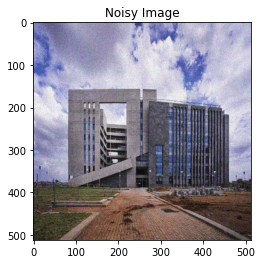

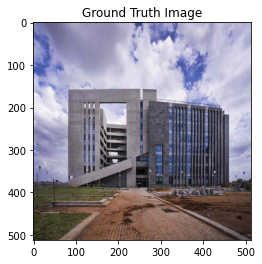

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


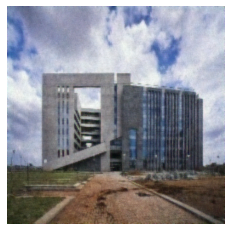

In [18]:
CBDNet = tf.keras.models.load_model(r'C:\\Users\\V RAHUL\\Codes\\EE6310\\CBDNet.h5')

gt_path='C:\\Users\\V RAHUL\\Codes\\EE6310\original.jpeg'
test_img_gt = cv2.imread(gt_path)
test_img_gt = cv2.cvtColor(test_img_gt, cv2.COLOR_BGR2RGB)
test_img_gt = cv2.resize(test_img_gt,(512,512))
test_img_gt = test_img_gt.astype("float32") / 255.0

nsy_path='C:\\Users\\V RAHUL\\Codes\\EE6310\\noisy.jpg'
test_img_nsy = cv2.imread(nsy_path)
pred_img = prediction(test_img_nsy,CBDNet)
pred_img = cv2.resize(pred_img,(512,512))

test_img_nsy = cv2.cvtColor(test_img_nsy, cv2.COLOR_BGR2RGB)
test_img_nsy = cv2.resize(test_img_nsy,(512,512))
test_img_nsy = test_img_nsy.astype("float32") / 255.0

plt.imshow(test_img_nsy)
plt.title("Noisy Image")
plt.show()

plt.imshow(test_img_gt)
plt.title("Ground Truth Image")
plt.show()

plt.imshow(pred_img)
#plt.title("Predicted Image")
plt.axis('off')
plt.show()

#PRIDNet
The PRIDNet architecture is as shown below :
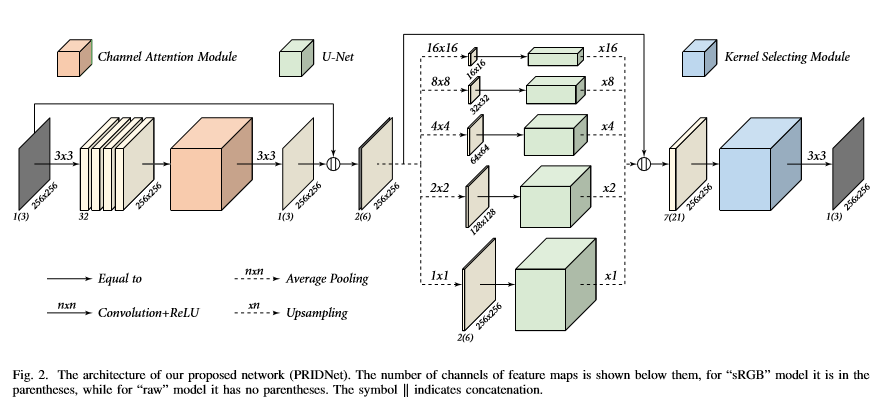

##Noise Estimation Stage

In [19]:
#https://github.com/491506870/PRIDNet/blob/master/network.py
class convolutional_block1(tf.keras.layers.Layer):
    def __init__(self,filters,**kwargs):
        super().__init__(**kwargs)
        self.filters = filters 
        self.conv1 = Conv2D(filters = self.filters, kernel_size=3,activation='relu',padding='same',kernel_initializer='he_normal')
        self.conv2 = Conv2D(filters = self.filters, kernel_size=3,activation='relu',padding='same',kernel_initializer='he_normal')
        self.conv3 = Conv2D(filters = self.filters, kernel_size=3,activation='relu',padding='same',kernel_initializer='he_normal')
        self.conv4 = Conv2D(filters = self.filters, kernel_size=3,activation='relu',padding='same',kernel_initializer='he_normal')

    def get_config(self):
      config = super().get_config().copy()
      config.update({'filters': self.filters})
      return config

    def call(self, X):
        X = self.conv1(X)
        X = self.conv2(X)
        X = self.conv3(X)
        X = self.conv4(X)
        return X

In [20]:
class CAM(tf.keras.layers.Layer):
  def __init__(self, **kwargs):
    super().__init__(**kwargs)
    self.gap = GlobalAveragePooling2D()
    self.dense1 = Dense(units=2,activation='relu')
    self.dense2 = Dense(units=32,activation='sigmoid')

  def call(self, X):
    Y = self.gap(X)
    Y = self.dense1(Y)
    Y = self.dense2(Y)
    X = Multiply()([X,Y])
    return X

##Multi Stage Denoising

In [21]:
class convolutional_block2(tf.keras.layers.Layer):
    def __init__(self,filters,**kwargs):
        super().__init__(**kwargs)
        self.filters = filters 
        self.conv1 = Conv2D(filters = self.filters, kernel_size=3,activation='relu',padding='same',kernel_initializer='he_normal')
        self.conv2 = Conv2D(filters = self.filters, kernel_size=3,activation='relu',padding='same',kernel_initializer='he_normal')
        self.conv3 = Conv2D(filters = self.filters, kernel_size=3,activation='relu',padding='same',kernel_initializer='he_normal')

    def get_config(self):
        config = super().get_config().copy()
        config.update({'filters': self.filters})
        return config

    def call(self, X):
        X = self.conv1(X)
        X = self.conv2(X)
        X = self.conv3(X)
        return X

In [22]:
class pyramid(tf.keras.layers.Layer):
  def __init__(self,pool_size, upsample_size, **kwargs):
    super().__init__(**kwargs)
    self.pool_size = pool_size
    self.upsample_size = upsample_size
    self.upsample = UpSampling2D(self.upsample_size, interpolation='bilinear')
    self.pool = AveragePooling2D(pool_size=(self.pool_size,self.pool_size))
    
    self.conv1 = convolutional_block1(filters=32)
    self.maxpool1 = MaxPool2D(pool_size=[2, 2], padding='same')

    self.conv2 = convolutional_block1(filters=64)
    self.maxpool2 = MaxPool2D(pool_size=[2, 2], padding='same')

    self.conv3 = convolutional_block1(filters=128)
    self.maxpool3 = MaxPool2D(pool_size=[2, 2], padding='same')

    self.conv4 = convolutional_block1(filters=256)
    self.maxpool4 = MaxPool2D(pool_size=[2, 2], padding='same')

    self.conv5 = convolutional_block1(filters=512)
    
    self.upsample1 = Conv2DTranspose(256, (3, 3), strides=2,kernel_initializer='he_normal',padding="same")
    self.conv6 = convolutional_block2(filters=256)

    self.upsample2 = Conv2DTranspose(128, (3, 3), strides=2,kernel_initializer='he_normal',padding="same")
    self.conv7 = convolutional_block2(filters=128)
    
    self.upsample3 = Conv2DTranspose(64, (3, 3), strides=2,kernel_initializer='he_normal',padding="same")
    self.conv8 = convolutional_block2(filters=64)

    self.upsample4 = Conv2DTranspose(32, (3, 3), strides=2,kernel_initializer='he_normal',padding="same")
    self.conv9 = convolutional_block2(filters=32)

    self.conv10 = Conv2D(filters = 3, kernel_size=1,padding='same',kernel_initializer='he_normal')

  def get_config(self):
    config = super().get_config().copy()
    config.update({'pool_size': self.pool_size,'upsample_size':self.upsample_size})
    return config

  def call(self, input):
    conv1 = self.pool(input)
    
    conv1 = self.conv1(conv1)
    pool1 = self.maxpool1(conv1)
    
    conv2 = self.conv2(pool1)
    pool2 = self.maxpool2(conv2)

    conv3 = self.conv3(pool2)
    pool3 = self.maxpool3(conv3)

    conv4 = self.conv4(pool3)
    pool4 = self.maxpool4(conv4)

    conv5 = self.conv5(pool4)

    up1 = self.upsample1(conv5)
    concat1 = concatenate([up1,conv4])
    conv6 = self.conv6(concat1)

    up2 = self.upsample2(conv6)    
    concat2 = concatenate([up2,conv3])
    conv7 = self.conv7(concat2)


    up3 = self.upsample3(conv7)
    concat3 = concatenate([up3,conv2])
    conv8 = self.conv8(concat3)

    up4 = self.upsample4(conv8)
    concat4 = concatenate([up4,conv1])
    conv9 = self.conv9(concat4)
 
    conv10 = self.conv10(conv9)
    out = self.upsample(conv10)

    return out

##Feature Fusion Stage

In [23]:
class KSM(tf.keras.layers.Layer):
  def __init__(self, **kwargs):
    super().__init__(**kwargs)
    self.conv1 = Conv2D(filters = 21, kernel_size=3,activation='relu',padding='same',kernel_initializer='he_normal')
    self.conv2 = Conv2D(filters = 21, kernel_size=5,activation='relu',padding='same',kernel_initializer='he_normal')
    self.conv3 = Conv2D(filters = 21, kernel_size=7,activation='relu',padding='same',kernel_initializer='he_normal')
    self.gap = GlobalAveragePooling2D()
    self.fc1 = Dense(units=2,activation='relu')
    self.fc2_1 = Dense(units=21)
    self.fc2_2 = Dense(units=21)
    self.fc2_3 = Dense(units=21)

  def call(self, input):
    conv1 = self.conv1(input)
    conv2 = self.conv2(input)
    conv3 = self.conv3(input)
    sum = Add()([conv1,conv2,conv3])
    gap =  self.gap(sum)
    gap = tf.reshape(gap, [-1, 1, 1, 21])
    fc1 = self.fc1(gap)
    a1 = self.fc2_1(fc1)
    a2 = self.fc2_2(fc1)
    a3 = self.fc2_3(fc1)

    before_softmax = concatenate([a1, a2, a3],1)
    after_softmax = softmax(before_softmax,axis=1)

    a1 = after_softmax[:, 0, :, :]
    a1 = tf.reshape(a1, [-1, 1, 1, 21])

    a2 = after_softmax[:, 1, :, :]
    a2 = tf.reshape(a2, [-1, 1, 1, 21])

    a3 = after_softmax[:, 2, :, :]
    a3 = tf.reshape(a3, [-1, 1, 1, 21])

    out1 = Multiply()([a1,conv1])
    out2 = Multiply()([a2,conv2])
    out3 = Multiply()([a3,conv3])
    out = Add()([out1,out2,out3])
    return out                      

##Model Creation

In [24]:
tf.keras.backend.clear_session()
input = Input(shape=(256, 256, 3))

C1 = convolutional_block1(filters=32)(input)
cam = CAM()(C1)
C2 = Conv2D(filters = 3, kernel_size=3,activation='relu',padding='same',kernel_initializer='he_normal')(cam)
concat1 = concatenate([C2,input])

p1 = pyramid(pool_size=1,upsample_size=1)(concat1)
p2 = pyramid(pool_size=2,upsample_size=2)(concat1)
p3 = pyramid(pool_size=4,upsample_size=4)(concat1)
p4 = pyramid(pool_size=8,upsample_size=8)(concat1)
p5 = pyramid(pool_size=16,upsample_size=16)(concat1)

concat2 = concatenate([p1,p2,p3,p4,p5,concat1])
ksm = KSM()(concat2)
out = Conv2D(filters = 3, kernel_size=1,padding='same',kernel_initializer='he_normal')(ksm)

PRIDNet = Model(input,out)
PRIDNet.compile(optimizer=tf.keras.optimizers.Adam(1e-03), loss=tf.keras.losses.MeanSquaredError())
PRIDNet.summary()


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Index'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Index'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
_________________________________________________________________________________

In [32]:
log_dir="logs/model_3"
tensorboard = tf.keras.callbacks.TensorBoard(log_dir=log_dir,histogram_freq=1, write_graph=True,write_grads=True)
reducelr = ReduceLROnPlateau(monitor='val_loss', factor=0.1,verbose=1,patience=3,min_delta=0.00001)
callback = [tensorboard,reducelr]
PRIDNet.fit(train_dataloader,shuffle=True,epochs=10,validation_data= test_dataloader,callbacks=callback)
PRIDNet.save('PRIDNet.h5')

Epoch 1/10
20/20 [==============================] - 996s 50s/step - loss: 0.0439 - val_loss: 0.0193
Epoch 2/10
20/20 [==============================] - 1069s 53s/step - loss: 0.0142 - val_loss: 0.0114
Epoch 3/10
20/20 [==============================] - 1040s 52s/step - loss: 0.0085 - val_loss: 0.0071
Epoch 4/10
20/20 [==============================] - 1039s 52s/step - loss: 0.0058 - val_loss: 0.0057
Epoch 5/10
20/20 [==============================] - 970s 48s/step - loss: 0.0049 - val_loss: 0.0051
Epoch 6/10
20/20 [==============================] - 1221s 61s/step - loss: 0.0044 - val_loss: 0.0046
Epoch 7/10
20/20 [==============================] - 942s 47s/step - loss: 0.0041 - val_loss: 0.0043
Epoch 8/10
20/20 [==============================] - 931s 47s/step - loss: 0.0038 - val_loss: 0.0039
Epoch 9/10
20/20 [==============================] - 920s 46s/step - loss: 0.0035 - val_loss: 0.0036
Epoch 10/10
20/20 [==============================] - 1103s 55s/step - loss: 0.0032 - val_loss: 0

(256, 256, 3)
(1, 256, 256, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(1, 256, 256, 3)
(256, 256, 3)
(1, 256, 256, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(1, 256, 256, 3)
(256, 256, 3)
(1, 256, 256, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(1, 256, 256, 3)


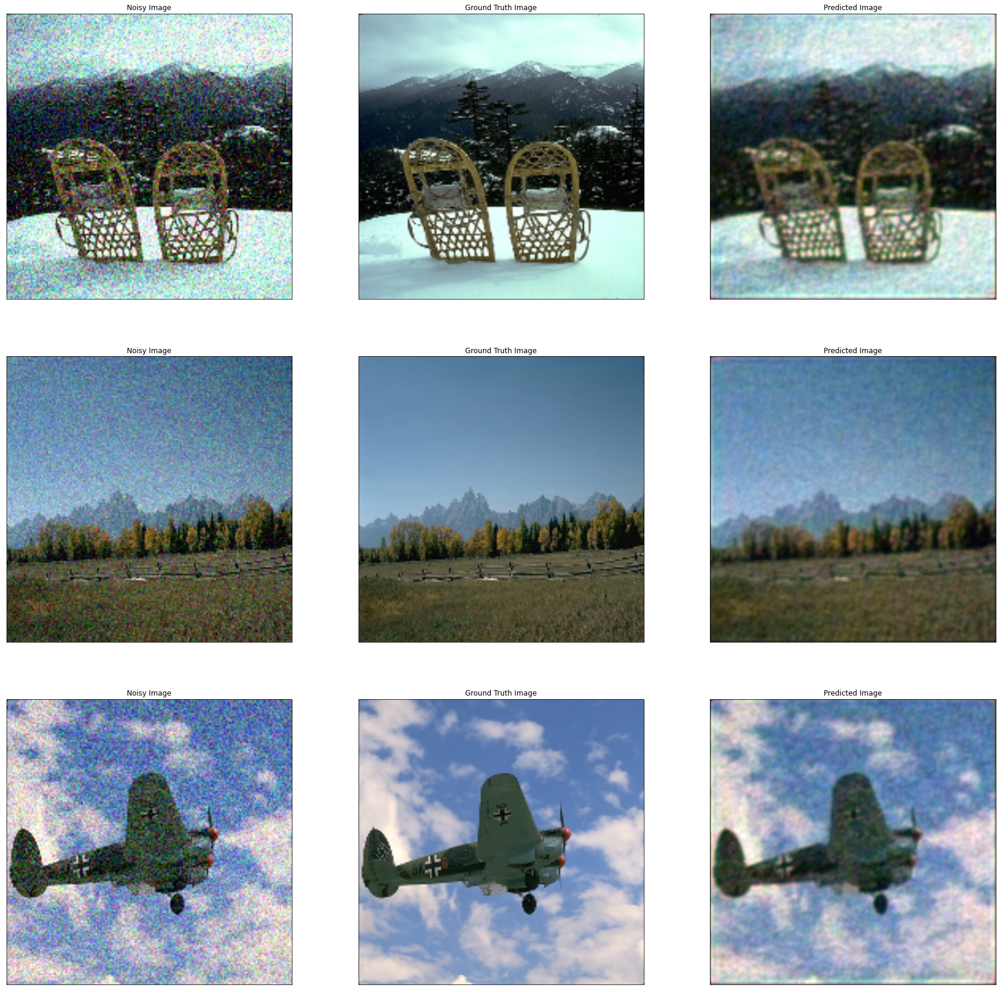

In [45]:
PRIDNet = tf.keras.models.load_model(r'C:\\Users\\V RAHUL\\Codes\\EE6310\\PRIDNet.h5',custom_objects={'convolutional_block1':convolutional_block1, 'CAM':CAM,'convolutional_block2':convolutional_block2,'pyramid':pyramid,'KSM':KSM})
visualize(sample,PRIDNet)

In [82]:
psnr_nsy, psnr_de_nsy, ssim_nsy, ssim_de_nsy = psnr_and_ssim(X_test,y_test,PRIDNet)
print('PSNR before denoising :', psnr_nsy)
print('PSNR after denoising :', psnr_de_nsy)
print('SSIM before denoising :', ssim_nsy)
print('SSIM after denoising :', ssim_de_nsy)

PSNR before denoising : 16.46400013384434
PSNR after denoising : 25.10897196196253
SSIM before denoising : 0.5224263895812342
SSIM after denoising : 0.701366901175838


In [85]:
model_size = round((os.stat(r'C:\\Users\\V RAHUL\\Codes\\EE6310\\PRIDNet.h5').st_size)/(1024**2),3)
PSNR.append(round(psnr_de_nsy,3))
SSIM.append(round(ssim_de_nsy,3))
PSNR_imp.append(round(psnr_de_nsy-psnr_nsy,3))
SSIM_imp.append(round(ssim_de_nsy-ssim_nsy,3))
size.append(model_size)

In [25]:
PRIDNet = tf.keras.models.load_model(r'C:\\Users\\V RAHUL\\Codes\\EE6310\\PRIDNet.h5',custom_objects={'convolutional_block1':convolutional_block1, 'CAM':CAM,'convolutional_block2':convolutional_block2,'pyramid':pyramid,'KSM':KSM})

df = pd.DataFrame()

dir = os.listdir(r'C:\\Users\\V RAHUL\\Codes\\EE6310\Datasets\\CBSD68\\noisy15')
GT = []
for image in dir:
  GT.append(r'C:\\Users\\V RAHUL\\Codes\\EE6310\Datasets\\CBSD68\\noisy15\\'+image)

dir = os.listdir(r'C:\\Users\\V RAHUL\\Codes\\EE6310\Datasets\\CBSD68\\original_png')
Nsy=[]
for image in dir:
  Nsy.append(r'C:\\Users\\V RAHUL\\Codes\\EE6310\Datasets\\CBSD68\\original_png\\'+image)

df['Ground Truth Images'] = GT
df['Noisy Images'] = Nsy

X_test = df['Noisy Images']
y_test = df['Ground Truth Images']

psnr_mean,psnr_std,ssim_mean,ssim_std = psnr_and_ssim_(X_test,y_test,PRIDNet)
print('PSNR mean :', psnr_mean)
print('PSNR std :', psnr_std)
print('SSIM mean :', ssim_mean)
print('SSIM std :', ssim_std)

PSNR mean : 23.264207647260918
PSNR std : 1.7575020706879547
SSIM mean : 0.5607153437653389
SSIM std : 0.07501703319768632


In [26]:
df = pd.DataFrame()

dir = os.listdir(r'C:\\Users\\V RAHUL\\Codes\\EE6310\Datasets\\CBSD68\\noisy25')
GT = []
for image in dir:
  GT.append(r'C:\\Users\\V RAHUL\\Codes\\EE6310\Datasets\\CBSD68\\noisy25\\'+image)

dir = os.listdir(r'C:\\Users\\V RAHUL\\Codes\\EE6310\Datasets\\CBSD68\\original_png')
Nsy=[]
for image in dir:
  Nsy.append(r'C:\\Users\\V RAHUL\\Codes\\EE6310\Datasets\\CBSD68\\original_png\\'+image)

df['Ground Truth Images'] = GT
df['Noisy Images'] = Nsy

X_test = df['Noisy Images']
y_test = df['Ground Truth Images']

psnr_mean,psnr_std,ssim_mean,ssim_std = psnr_and_ssim_(X_test,y_test,PRIDNet)
print('PSNR mean :', psnr_mean)
print('PSNR std :', psnr_std)
print('SSIM mean :', ssim_mean)
print('SSIM std :', ssim_std)

PSNR mean : 21.36106476314321
PSNR std : 1.1212270856119093
SSIM mean : 0.4284145308928118
SSIM std : 0.08650227280654557


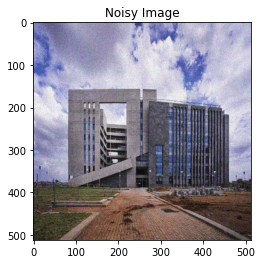

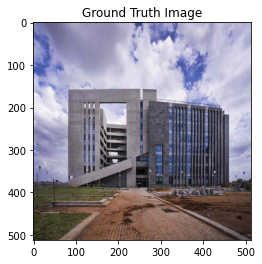

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


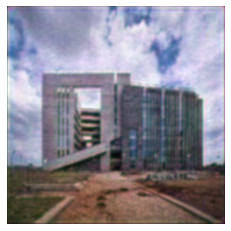

In [25]:
PRIDNet = tf.keras.models.load_model(r'C:\\Users\\V RAHUL\\Codes\\EE6310\\PRIDNet.h5',custom_objects={'convolutional_block1':convolutional_block1, 'CAM':CAM,'convolutional_block2':convolutional_block2,'pyramid':pyramid,'KSM':KSM})

gt_path='C:\\Users\\V RAHUL\\Codes\\EE6310\original.jpeg'
test_img_gt = cv2.imread(gt_path)
test_img_gt = cv2.cvtColor(test_img_gt, cv2.COLOR_BGR2RGB)
test_img_gt = cv2.resize(test_img_gt,(512,512))
test_img_gt = test_img_gt.astype("float32") / 255.0

nsy_path='C:\\Users\\V RAHUL\\Codes\\EE6310\\noisy.jpg'
test_img_nsy = cv2.imread(nsy_path)
pred_img = prediction(test_img_nsy,PRIDNet)
pred_img = cv2.resize(pred_img,(512,512))

test_img_nsy = cv2.cvtColor(test_img_nsy, cv2.COLOR_BGR2RGB)
test_img_nsy = cv2.resize(test_img_nsy,(512,512))
test_img_nsy = test_img_nsy.astype("float32") / 255.0

plt.imshow(test_img_nsy)
plt.title("Noisy Image")
plt.show()

plt.imshow(test_img_gt)
plt.title("Ground Truth Image")
plt.show()

plt.imshow(pred_img)
#plt.title("Predicted Image")
plt.axis('off')
plt.show()